In [1]:
import os
os.environ["KAGGLE_USERNAME"]="manushreegrover"
os.environ["KAGGLE_KEY"]="a3289a5a8d109b8513b3b83f58bb0c82"
!kaggle datasets download tourist55/alzheimers-dataset-4-class-of-images
!kaggle datasets download uraninjo/augmented-alzheimer-mri-dataset

alzheimers-dataset-4-class-of-images.zip: Skipping, found more recently modified local copy (use --force to force download)
augmented-alzheimer-mri-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [2]:
from IPython.display import clear_output

!unzip /content/alzheimers-dataset-4-class-of-images.zip
!unzip /content/augmented-alzheimer-mri-dataset.zip

clear_output()

In [3]:
train=r"/content/AugmentedAlzheimerDataset"
test=r"/content/Alzheimer_s Dataset/test"

In [4]:
%load_ext tensorboard
import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.layers import Conv2D,MaxPool2D,Dense,Flatten,Dropout  #also import LSTM ,BatchNormalization
from tensorflow.keras.models import Sequential,Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import cv2
import numpy as np

In [5]:
image_data_gen=ImageDataGenerator(rescale=1/255.,horizontal_flip=True
                                 ) #pre processing,augmentation

x_train=image_data_gen.flow_from_directory(train,target_size=(224,224),batch_size=32,class_mode="sparse")
x_test=image_data_gen.flow_from_directory(test,target_size=(224,224),batch_size=32,class_mode="sparse")

Found 33984 images belonging to 4 classes.
Found 1279 images belonging to 4 classes.


In [6]:
from tensorflow.keras.applications import DenseNet169

In [7]:
from tensorflow.keras.layers import Dropout, Flatten, BatchNormalization, Dense, Activation
# Load the DenseNet169 model pre-trained on ImageNet data
dense = DenseNet169()

# Freeze the layers of the pre-trained model
# for layer in dense.layers:
#     layer.trainable = False

# Add your custom layers on top of the pre-trained DenseNet169 model
x = dense.output
# x = Dropout(0.5)(x)
# x = Flatten()(x)
# x = BatchNormalization()(x)
# x = Dense(2048, kernel_initializer='he_uniform')(x)
# x = BatchNormalization()(x)
# x = Activation('relu')(x)
# x = Dropout(0.5)(x)
# x = Dense(1024, kernel_initializer='he_uniform')(x)
# x = BatchNormalization()(x)
# x = Activation('relu')(x)
# x = Dropout(0.5)(x)
x=Dense(1024,activation="relu")(x)
output = Dense(4, activation='softmax')(x)

# Create a new model with the combined architecture
model = Model(inputs=dense.input, outputs=output)

# Display the model summary
#model.summary()

58541896/58541896 [==============================] - 1s 0us/step


In [8]:
from tensorflow.python.ops import histogram_ops
from datetime import datetime as dt
# #m=model.fit(x_train,epochs=15,callbacks=[tensorboard_callback])
def train_model():
   model.compile(optimizer="adam",loss="sparse_categorical_crossentropy",metrics=['accuracy'])

   logdir=os.path.join("logs",dt.now().strftime("%Y%m%d-%H%M%S"))
   tensorboard_callback=tf.keras.callbacks.TensorBoard(logdir,histogram_freq=1)
   model.fit(x_train,epochs=10,callbacks=[tensorboard_callback])

In [10]:
train_model()

Epoch 1/10


KeyboardInterrupt: ignored

In [11]:
model.evaluate(x_test)

40/40 [==============================] - 21s 278ms/step - loss: 0.5348 - accuracy: 0.7725


[0.5347724556922913, 0.7724785208702087]

In [12]:
y_pred = model.predict(x_test)

40/40 [==============================] - 8s 117ms/step


In [13]:
y_pred[0]

array([2.0813087e-03, 9.5971016e-05, 1.5810999e-01, 8.3971268e-01],
      dtype=float32)

In [14]:
y_pred = np.argmax(y_pred, axis=1)

In [15]:
y_test = []
for i in range(int(x_test.n/32) + 1):
  img, labels = next(x_test)
  for label in labels:
    y_test.append(label)

In [16]:
y_test[:4]

[3.0, 2.0, 2.0, 3.0]

In [17]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [18]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

1/1 [==============================] - 4s 4s/step


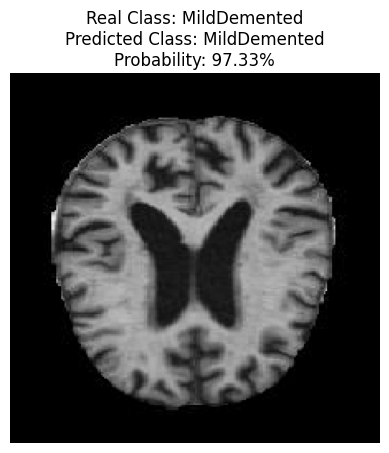

1/1 [==============================] - 0s 36ms/step


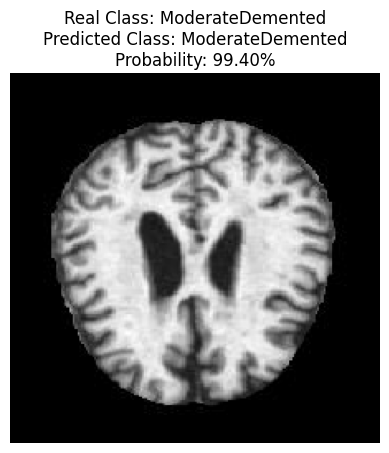

1/1 [==============================] - 0s 35ms/step


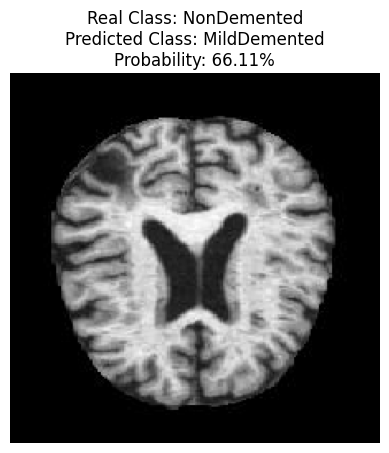

1/1 [==============================] - 0s 34ms/step


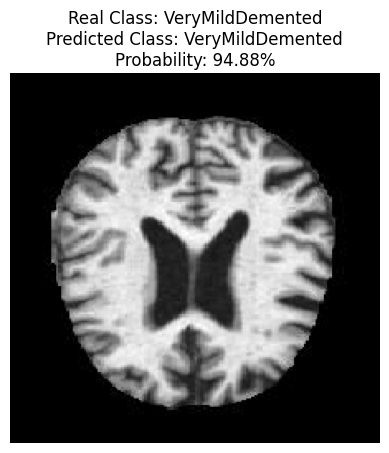

In [19]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import matplotlib.pyplot as plt

# Assuming 'model' is your trained model

def predict_image(image_path):
    # Load and preprocess the image
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0  # Normalize the pixel values

    # Predict the class probabilities
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions)
    predicted_probability = np.max(predictions) * 100

    # Map class index to class label (you need to define your class labels)
    class_labels = {0: 'MildDemented', 1: 'ModerateDemented', 2: 'NonDemented', 3: 'VeryMildDemented'}
    predicted_class_label = class_labels[predicted_class]

    # Display the results
    plt.imshow(img)
    plt.title(f'Real Class: {image_path.split("/")[-2]}\nPredicted Class: {predicted_class_label}\nProbability: {predicted_probability:.2f}%')
    plt.axis('off')
    plt.show()

# Test the function with four image paths
image_paths = [
    '/content/Alzheimer_s Dataset/test/MildDemented/26 (23).jpg',
    '/content/Alzheimer_s Dataset/test/ModerateDemented/30.jpg',
    '/content/Alzheimer_s Dataset/test/NonDemented/26 (68).jpg',
    '/content/Alzheimer_s Dataset/test/VeryMildDemented/26 (48).jpg'
]

for path in image_paths:
    predict_image(path)

In [20]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 zero_padding2d (ZeroPaddin  (None, 230, 230, 3)          0         ['input_1[0][0]']             
 g2D)                                                                                             
                                                                                                  
 conv1/conv (Conv2D)         (None, 112, 112, 64)         9408      ['zero_padding2d[0][0]']      
                                                                                                  
 conv1/bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1/conv[0][0]']      

In [21]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Example image paths (replace these with your actual image paths)
image_paths = ['/content/Alzheimer_s Dataset/test/MildDemented/26 (23).jpg',
    '/content/Alzheimer_s Dataset/test/ModerateDemented/30.jpg',
    '/content/Alzheimer_s Dataset/test/NonDemented/26 (91).jpg',
    '/content/Alzheimer_s Dataset/test/VeryMildDemented/26 (48).jpg'

]

# Function to predict and display results
def predict_and_display(image_path):
    # Load and preprocess the image
    img = load_img(image_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0

    # Make predictions
    prediction = model.predict(img_array)
    predicted_class = np.argmax(prediction)
    probability = np.max(prediction)

    # Display results
    print(f"Image: {image_path}")
    print(f"Real Class: {get_real_class(image_path)}")
    print(f"Predicted Class: {predicted_class}")
    print(f"Probability: {probability:.2%}")
    print("="*30)

# Function to get the real class from the image path
def get_real_class(image_path):
    # Extract the class name from the image path (modify as needed based on your dataset structure)
    return image_path.split('/')[-2]

# Iterate through the example image paths and make predictions
for image_path in image_paths:
    predict_and_display(image_path)

1/1 [==============================] - 0s 51ms/step
Image: /content/Alzheimer_s Dataset/test/MildDemented/26 (23).jpg
Real Class: MildDemented
Predicted Class: 0
Probability: 97.33%
1/1 [==============================] - 0s 50ms/step
Image: /content/Alzheimer_s Dataset/test/ModerateDemented/30.jpg
Real Class: ModerateDemented
Predicted Class: 1
Probability: 99.40%
1/1 [==============================] - 0s 49ms/step
Image: /content/Alzheimer_s Dataset/test/NonDemented/26 (91).jpg
Real Class: NonDemented
Predicted Class: 3
Probability: 91.28%
1/1 [==============================] - 0s 92ms/step
Image: /content/Alzheimer_s Dataset/test/VeryMildDemented/26 (48).jpg
Real Class: VeryMildDemented
Predicted Class: 3
Probability: 94.88%


In [22]:
# Assuming x_test is an instance of ImageDataGenerator
# Make sure that shuffle is set to False to maintain order
x_test.reset()

# Lists to store true and predicted labels
true_labels = []
predicted_labels = []

# Iterate through the test set and make predictions
for _ in range(int(np.ceil(x_test.n / x_test.batch_size))):
    images, labels = next(x_test)
    predictions = model.predict(images)
    predicted_classes = np.argmax(predictions, axis=1)

    true_labels.extend(labels)
    predicted_labels.extend(predicted_classes)

# Calculate the percentage of correctly predicted images
correct_predictions = np.sum(np.array(true_labels) == np.array(predicted_labels))
total_images = len(true_labels)
accuracy_percentage = (correct_predictions / total_images) * 100

print(f"Correctly Predicted Images: {correct_predictions}/{total_images}")
print(f"Accuracy: {accuracy_percentage:.2f}%")

1/1 [==============================] - 0s 43ms/step
Correctly Predicted Images: 987/1279
Accuracy: 77.17%


In [23]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Get model predictions on the test set
y_pred = model.predict(x_test)

# Convert predicted probabilities to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Compute additional metrics
accuracy = accuracy_score(y_test, y_pred_labels)
precision_micro = precision_score(y_test, y_pred_labels, average='micro')
recall_micro = recall_score(y_test, y_pred_labels, average='micro')
f1_micro = f1_score(y_test, y_pred_labels, average='micro')

precision_macro = precision_score(y_test, y_pred_labels, average='macro')
recall_macro = recall_score(y_test, y_pred_labels, average='macro')
f1_macro = f1_score(y_test, y_pred_labels, average='macro')

# Print additional metrics
print(f"Accuracy: {accuracy:.2f}")
print(f"Micro Precision: {precision_micro:.2f}")
print(f"Micro Recall: {recall_micro:.2f}")
print(f"Micro F1 Score: {f1_micro:.2f}")

print(f"Macro Precision: {precision_macro:.2f}")
print(f"Macro Recall: {recall_macro:.2f}")
print(f"Macro F1 Score: {f1_macro:.2f}")

40/40 [==============================] - 5s 131ms/step
Accuracy: 0.37
Micro Precision: 0.37
Micro Recall: 0.37
Micro F1 Score: 0.37
Macro Precision: 0.25
Macro Recall: 0.25
Macro F1 Score: 0.25


In [24]:
# Assuming binary classification for simplicity
from sklearn.metrics import accuracy_score, precision_score, recall_score

# Get model predictions on the test set
y_pred = model.predict(x_test)

# Convert predicted probabilities to class labels
y_pred_labels = np.argmax(y_pred, axis=1)

# Compute additional metrics
accuracy = accuracy_score(y_test, y_pred_labels)
precision = precision_score(y_test, y_pred_labels, average='weighted')
recall = recall_score(y_test, y_pred_labels, average='weighted')

# Print additional metrics
print(f"Additional Accuracy: {accuracy}")
print(f"Additional Precision: {precision}")
print(f"Additional Recall: {recall}")

40/40 [==============================] - 5s 124ms/step
Additional Accuracy: 0.36903831118060987
Additional Precision: 0.38709935083383873
Additional Recall: 0.36903831118060987


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6).
0 upgraded, 0 newly installed, 0 to remove and 6 not upgraded.
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.494581 to fit



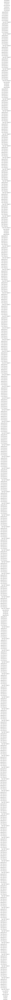

In [25]:
!pip install pydot graphviz
!apt-get install graphviz
from tensorflow.keras.utils import plot_model
from IPython.display import Image

# Assuming 'model' is your Keras model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

# Display the image in the notebook
Image(filename='model_plot.png')